# Transfer Learning

In this notebook, you'll learn how to use pre-trained networks to solved challenging problems in computer vision. Specifically, you'll use networks trained on [ImageNet](http://www.image-net.org/) [available from torchvision](http://pytorch.org/docs/0.3.0/torchvision/models.html). 

ImageNet is a massive dataset with over 1 million labeled images in 1000 categories. It's used to train deep neural networks using an architecture called convolutional layers. I'm not going to get into the details of convolutional networks here, but if you want to learn more about them, please [watch this](https://www.youtube.com/watch?v=2-Ol7ZB0MmU).

Once trained, these models work astonishingly well as feature detectors for images they weren't trained on. Using a pre-trained network on images not in the training set is called transfer learning. Here we'll use transfer learning to train a network that can classify our cat and dog photos with near perfect accuracy.

With `torchvision.models` you can download these pre-trained networks and use them in your applications. We'll include `models` in our imports now.

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt

import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models

import helper

Most of the pretrained models require the input to be 224x224 images. Also, we'll need to match the normalization used when the models were trained. Each color channel was normalized separately, the means are `[0.485, 0.456, 0.406]` and the standard deviations are `[0.229, 0.224, 0.225]`.

In [2]:
data_dir = 'Cat_Dog_data'

# TODO: Define transforms for the training data and testing data
train_transforms = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],  # means of 3 channels
                         [0.229, 0.224, 0.225])  # standard deviation of 3 channels
])

test_transforms = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],  # means of 3 channels
                         [0.229, 0.224, 0.225])  # standard deviation of 3 channels
])

# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(data_dir + '/train', transform=train_transforms)
test_data = datasets.ImageFolder(data_dir + '/test', transform=test_transforms)

trainloader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(test_data, batch_size=64, shuffle=True)

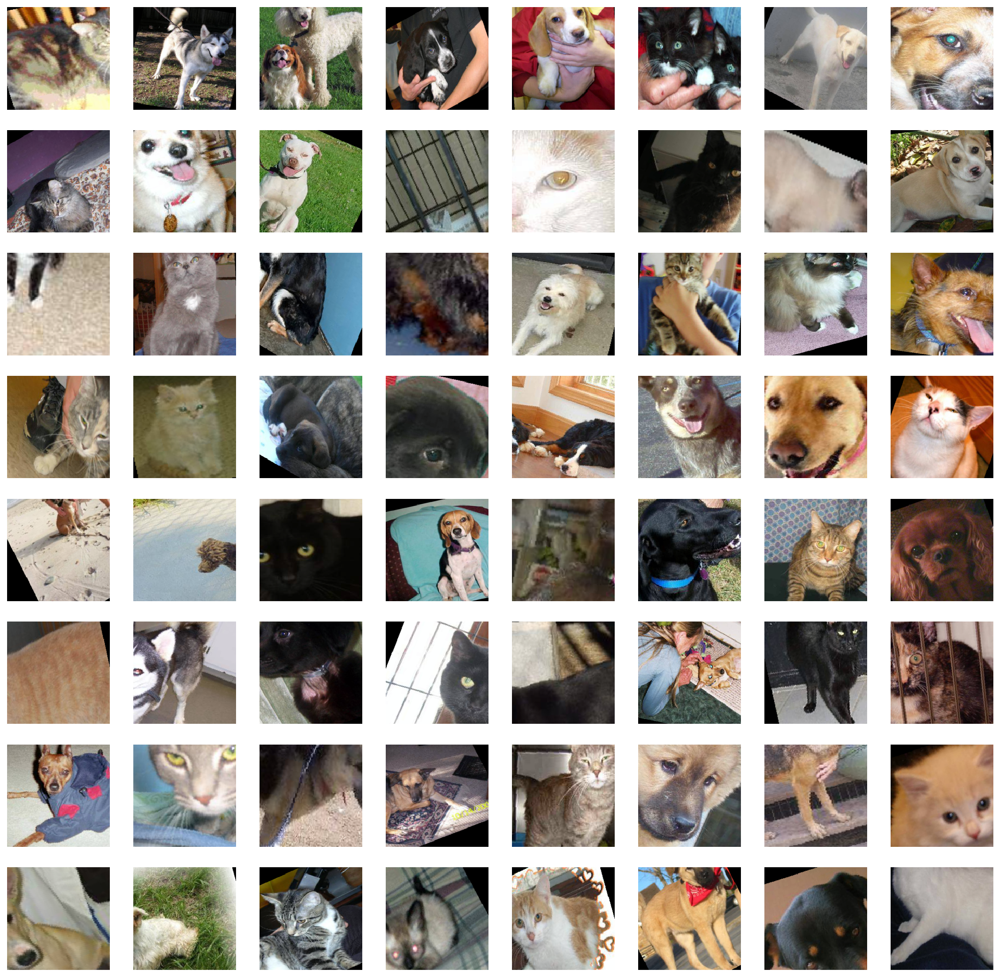

In [3]:
images, labels = next(iter(trainloader))

fig, axes = plt.subplots(figsize=(20, 20), ncols=8, nrows=8)
for i, image in enumerate(images):
    ax = axes[i // 8][i % 8]
    helper.imshow(image, ax=ax, normalize=True)

We can load in a model such as [DenseNet](http://pytorch.org/docs/0.3.0/torchvision/models.html#id5). Let's print out the model architecture so we can see what's going on.

In [4]:
model = models.densenet121(pretrained=True)
model

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplac

This model is built out of two main parts, the features and the classifier. The features part is a stack of convolutional layers and overall works as a feature detector that can be fed into a classifier. The classifier part is a single fully-connected layer `(classifier): Linear(in_features=1024, out_features=1000)`. This layer was trained on the ImageNet dataset, so it won't work for our specific problem. That means we need to replace the classifier, but the features will work perfectly on their own. In general, I think about pre-trained networks as amazingly good feature detectors that can be used as the input for simple feed-forward classifiers.

In [5]:
# Freeze parameters so we don't backprop through them
for param in model.parameters():
    param.requires_grad = False

from collections import OrderedDict

classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(1024, 500)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(500, 2)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
    
model.classifier = classifier

With our model built, we need to train the classifier. However, now we're using a **really deep** neural network. If you try to train this on a CPU like normal, it will take a long, long time. Instead, we're going to use the GPU to do the calculations. The linear algebra computations are done in parallel on the GPU leading to 100x increased training speeds. It's also possible to train on multiple GPUs, further decreasing training time.

PyTorch, along with pretty much every other deep learning framework, uses [CUDA](https://developer.nvidia.com/cuda-zone) to efficiently compute the forward and backwards passes on the GPU. In PyTorch, you move your model parameters and other tensors to the GPU memory using `model.to('cuda')`. You can move them back from the GPU with `model.to('cpu')` which you'll commonly do when you need to operate on the network output outside of PyTorch. As a demonstration of the increased speed, I'll compare how long it takes to perform a forward and backward pass with and without a GPU.

In [6]:
import time

In [7]:
for device in ['cpu', 'cuda']:
    criterion = nn.NLLLoss()
    
    # Only train the classifier parameters, feature parameters are frozen
    optimizer = optim.Adam(model.classifier.parameters(), lr=0.001)

    model.to(device)

    for i, (inputs, labels) in enumerate(trainloader):
        # Move input and label tensors to the GPU
        inputs, labels = inputs.to(device), labels.to(device)

        start = time.time()

        outputs = model.forward(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        if i == 3:
            break
        
    print(f"Device = {device}; Time per batch: {(time.time() - start)/3:.3f} seconds")

Device = cpu; Time per batch: 5.514 seconds
Device = cuda; Time per batch: 0.010 seconds


You can write device agnostic code which will automatically use CUDA if it's enabled like so:
```python
# at beginning of the script
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

...

# then whenever you get a new Tensor or Module
# this won't copy if they are already on the desired device
input = data.to(device)
model = MyModule(...).to(device)
```

From here, I'll let you finish training the model. The process is the same as before except now your model is much more powerful. You should get better than 95% accuracy easily.

>**Exercise:** Train a pretrained models to classify the cat and dog images. Continue with the DenseNet model, or try ResNet, it's also a good model to try out first. Make sure you are only training the classifier and the parameters for the features part are frozen.

In [8]:
# Use GPU if it's available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.densenet121(pretrained=True)

# Freeze parameters so we don't backprop through them
for param in model.parameters():
    param.requires_grad = False
    
model.classifier = nn.Sequential(
    nn.Linear(1024, 256),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(256, 2),
    nn.LogSoftmax(dim=1)
)

criterion = nn.NLLLoss()

# Only train the classifier parameters, feature parameters are frozen
optimizer = optim.Adam(model.classifier.parameters(), lr=0.003)

model.to(device);

In [9]:
epochs = 1
steps = 0
train_loss = 0
print_every = 5

for epoch in range(epochs):
    for inputs, labels in trainloader:
        steps += 1
        
        # Move input and label tensors to the default device
        inputs, labels = inputs.to(device), labels.to(device)
        
        log_ps = model.forward(inputs)
        loss = criterion(log_ps, labels)
        train_loss += loss
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if steps % print_every == 0:
            test_loss = 0
            accuracy = 0
            
            model.eval()
            with torch.no_grad():
                for inputs, labels in testloader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    
                    log_ps = model.forward(inputs)
                    test_loss += criterion(log_ps, labels)
                    
                    # Calculate accuracy
                    ps = torch.exp(log_ps)
                    top_p, top_class = ps.topk(1, dim=1)
                    equals = (top_class == labels.view(*top_class.shape))
                    accuracy += torch.mean(equals.type(torch.FloatTensor))
                    
            print(f'Epoch {epoch+1}/{epochs}.. '
                  f'Train Loss: {train_loss / print_every:.3f}.. '
                  f'Test Loss: {test_loss / len(testloader):.3f}.. '
                  f'Test Accuracy: {accuracy/len(testloader):.3f}')
            
            train_loss = 0
            model.train()

Epoch 1/1.. Train Loss: 0.829.. Test Loss: 0.517.. Test Accuracy: 0.691
Epoch 1/1.. Train Loss: 0.448.. Test Loss: 0.139.. Test Accuracy: 0.972
Epoch 1/1.. Train Loss: 0.245.. Test Loss: 0.084.. Test Accuracy: 0.980
Epoch 1/1.. Train Loss: 0.176.. Test Loss: 0.067.. Test Accuracy: 0.976
Epoch 1/1.. Train Loss: 0.222.. Test Loss: 0.060.. Test Accuracy: 0.980
Epoch 1/1.. Train Loss: 0.153.. Test Loss: 0.066.. Test Accuracy: 0.975
Epoch 1/1.. Train Loss: 0.173.. Test Loss: 0.053.. Test Accuracy: 0.982
Epoch 1/1.. Train Loss: 0.156.. Test Loss: 0.068.. Test Accuracy: 0.973
Epoch 1/1.. Train Loss: 0.167.. Test Loss: 0.052.. Test Accuracy: 0.982
Epoch 1/1.. Train Loss: 0.147.. Test Loss: 0.063.. Test Accuracy: 0.973
Epoch 1/1.. Train Loss: 0.131.. Test Loss: 0.057.. Test Accuracy: 0.982
Epoch 1/1.. Train Loss: 0.348.. Test Loss: 0.052.. Test Accuracy: 0.981
Epoch 1/1.. Train Loss: 0.181.. Test Loss: 0.056.. Test Accuracy: 0.980
Epoch 1/1.. Train Loss: 0.197.. Test Loss: 0.057.. Test Accuracy

In [10]:
# Save trained model
classifier_checkpoint = {
    'input_size': 1024,
    'hidden_layers': 256,
    'output_size': 2,
    'dropout_probability': 0.2,
    'state_dict': model.classifier.state_dict()
}

torch.save(classifier_checkpoint, 'classifier_checkpoint.pth')

In [11]:
# def load_trained_model(filepath):
#     classifier_checkpoint = torch.load(filepath)
    
#     model = models.densenet121(pretrained=True)
#     for param in model.parameters():
#         param.requires_grad = False
    
#     model.classifier = nn.Sequential(
#         nn.Linear(classifier_checkpoint['input_size'], classifier_checkpoint['hidden_layers']),
#         nn.ReLU(),
#         nn.Dropout(classifier_checkpoint['dropout_probability']),
#         nn.Linear(classifier_checkpoint['hidden_layers'], classifier_checkpoint['output_size']),
#         nn.LogSoftmax(dim=1)
#     )

#     model.classifier.load_state_dict(classifier_checkpoint['state_dict'])
    
#     return model


# model = load_trained_model('classifier_checkpoint.pth')
# print(model)

## TODO: Use a pretrained model to classify the cat and dog images

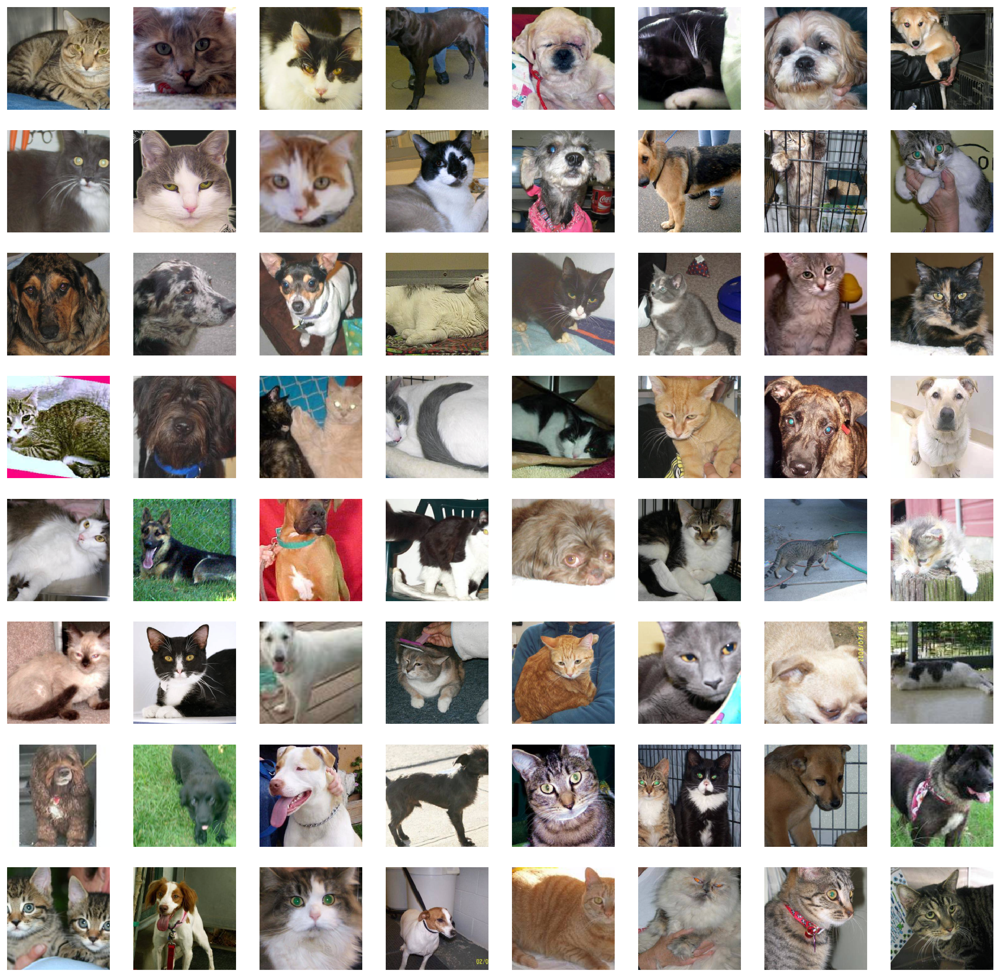

In [12]:
images, labels = next(iter(testloader))

fig, axes = plt.subplots(figsize=(20, 20), ncols=8, nrows=8)
for i, image in enumerate(images):
    ax = axes[i // 8][i % 8]
    helper.imshow(image, ax=ax, normalize=True)

In [13]:
images, labels = images.to(device), labels.to(device)

model.eval()

with torch.no_grad():
    log_ps = model.forward(images)
    ps = torch.exp(log_ps)
    top_p, top_class = ps.topk(1, dim=1)

In [14]:
print(labels.cpu().numpy())

[0 0 0 1 1 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0 1
 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0]


In [15]:
print(top_class.cpu().numpy().reshape(1, -1)[0])

[0 0 0 1 1 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 1 0 1
 0 1 0 0 0 1 0 0 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0]


In [16]:
print(top_p.cpu().numpy().reshape(1, -1)[0] * 100.0)

[ 99.99330139  99.99885559  99.99751282  99.91840363  99.90322876
  98.4409256   99.89421844  98.62911224  99.99980164  99.99875641
  99.95056152  99.95287323  99.6805954   99.68907928  87.17715454
  99.98154449  99.95406342  99.97870636  99.94856262  97.4739151
  99.93383789  99.96309662  99.9923172   99.95487213  99.91513824
  99.89533997  97.95767975  99.41017151  58.557827    99.9990921
  99.99642181  99.96963501  99.90723419  99.97852325  99.94484711
  98.90301514  80.99183655  99.99533081  78.91326904  99.79983521
  99.99250793  99.99613953  99.69837952  99.8507843   99.96105194
  99.9538269   97.59172058  58.60596466  95.98696136  99.8445282
  99.91361237  99.64804077  99.99761963  99.99589539  99.91127014
  99.88757324  99.99880219  99.7793045   99.99172974  99.91789246
  99.9932251   99.06876373  99.96181488  99.99895477]
